## Importing libraries and settings

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
#import statsmodels.api as sm
import plotly
import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from IPython.display import display, HTML

In [2]:
%matplotlib inline

sns.set(color_codes=True)
sns.set(style="whitegrid", palette="pastel", color_codes=True)

larger_dims = (20, 14)

# For Plotly
init_notebook_mode(connected=True)

<center><h1>UFO Sightings Analysis</h1></center>

<h1><u>Hypotheses:</u></h1>
<h3>H<sub>0</sub>: The number of UFO reports is not correlated with the number of flights departed
</h3>
<h3>H<sub>A</sub>: The number of UFO reports is correlated with the number of flights departed
</h3>

<h3>H<sub>0</sub>: 
</h3>
<h3>H<sub>A</sub>: 
</h3>

<h3>Study:</h3>
<ul>
    <li>Are UFO reports associated with the number of departing flights</li>
</ul>

<h1><u>Background:</u></h1><br>

<p>Recently, there has been an uptrend in UFO sightings. They've even made the news: just several days ago, the Pentagon released reports that they had been conducting a report on UFO sightings for five years. We wanted to study these extraterrestrial phenomena to gain some insights into the growth of this vein of urban myth. </p>

<h1><u>Data Profile:</u></h1><br>

## UFO Reports
<ul>
<li>Obtained from <b>Kaggle</b>. Collected by <b>NUFORC</b>. Scraped, geolocated, and time standardized by Sigmond Axel - https://github.com/planetsig/ufo-reports.
<li>Contains UFO reports dating back to 1941 up to 2014. <b>A lot</b> of reports!</li>
<li>There was a "scrubbed" version so we didn't have to do much cleaning.</li>
<li>Each record is one sighting. It contains data like:
    <ul>
        <li>Latitude and Longitude</li>
        <li>Shape</li>
        <li>Duration of sighting</li>
        <li>Comments</li>
    </ul>
</li>
</ul>

## US Air Carrier Aircraft Departures
<ul>
    <li>Contains data on aircraft departures of different categories</li>
    <li>Dates from 1975-2014. Earlier reports had some skipped yearly reports</li>
    <li>Data contains yearly departures performed</li>
    <li>Since it was in "spreadsheet format," it was heavily cleaned and transposed</li>
</ul>

## US Domestic Passenger and Cargo Flight Departures
<ul>
    <li>Contains more specific data on aircraft departures</li>
    <li>Dates from October 2002 to September 2017</li>
    <li>Obtained from Bureau of Transportation Statistics</li>
    <li>Minimal cleaning required.
    <li>Contains data on period (month) and total departures performed during that period</li>
</ul>

<h1><u>Results</u></h1>

<b>Read CSVs</b>

In [90]:
ufos = pd.read_csv("data/ufo-sightings/scrubbed.csv", sep=',', low_memory=False)
flights = pd.read_csv("data/flights/flights.csv", sep=',', low_memory=False)
mthPassengerFlights = pd.read_csv("data/flights/flight_passenger.csv", sep=',', low_memory=False)
mthCargoFlights = pd.read_csv("data/flights/flight_cargo.csv", sep=',', low_memory=False)
#airports = pd.read_csv("data/airports.csv", sep=',', low_memory=False)

<b>Clean and make usable</b>

In [91]:
ufos['dur_secs'] = pd.to_numeric(ufos['duration (seconds)'], errors="coerce")
ufos = ufos.drop('duration (seconds)', 1)
ufos['latitude'] = pd.to_numeric(ufos['latitude'], errors="coerce")
ufos['longitude'] = pd.to_numeric(ufos['longitude'], errors="coerce")
ufos.datetime = pd.to_datetime(ufos['datetime'], errors="coerce")

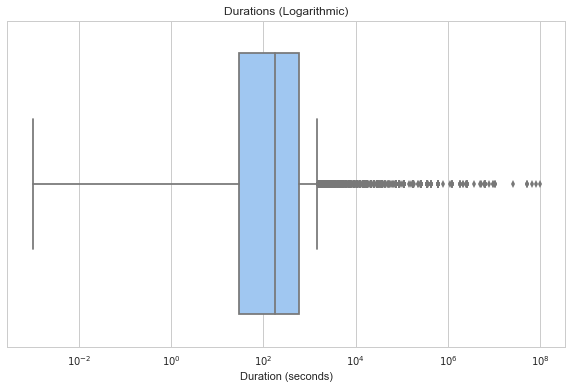

In [49]:
durations = pd.DataFrame(data=np.array(ufos.dur_secs))
fig, ax = plt.subplots()
ax.set(xscale="log")
fig.set_size_inches(10, 6)
plt.title('Durations (Logarithmic)')
plt.xlabel('Duration (seconds)')
pl = sns.boxplot(durations)

In [50]:
ufos.head()

,datetime,city,state,country,shape,duration (hours/min),comments,date posted,latitude,longitude,dur_secs
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,2700.0
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,7200.0
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,20.0
3,1956-10-10 21:00:00,edna,tx,us,circle,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,20.0
4,1960-10-10 20:00:00,kaneohe,hi,us,light,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,900.0


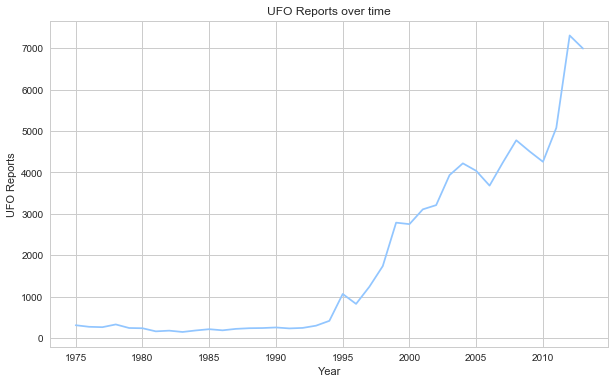

In [92]:
# Get UFO reports according to data

sample_ufos = ufos[(ufos.datetime.dt.year >= 1975) & (ufos.datetime.dt.year < 2014)]
ufos_per_year = sample_ufos.groupby(by=sample_ufos.datetime.dt.year).size()
fig, ax = plt.subplots()
fig.set_size_inches(10, 6)
#plt.semilogy(y=ufos_per_year)
plt.ylabel('UFO Reports')
plt.xlabel('Year')
plt.title('UFO Reports over time')
plt.plot(ufos_per_year, 'b')

*Note: The line chart seems to nose dive in recent years because the UFO data only goes up to the middle of 2014.*

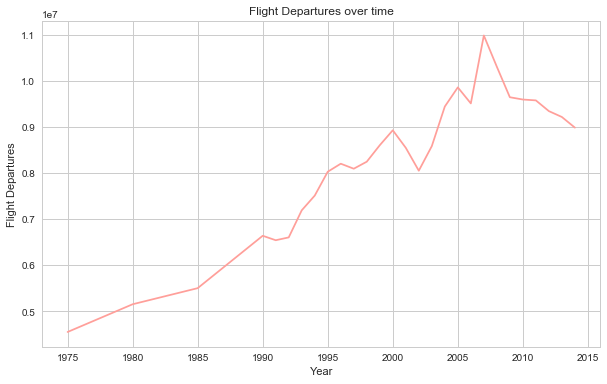

In [93]:
departs_by_year = pd.DataFrame(columns=['date', 'departs'])
departs_by_year.date = flights.Year
departs_by_year.departs = flights['Total performed']

fig, ax = plt.subplots()
fig.set_size_inches(10, 6)
plt.ylabel('Flight Departures')
plt.xlabel('Year')
plt.title('Flight Departures over time')
plt.plot(departs_by_year.date, departs_by_year.departs, 'r')

In [94]:
ufos_sample_data = ufos[(ufos.datetime.dt.year >= 1990) & (ufos.datetime.dt.year < 2014)]
ufos_sample_group_by = ufos_sample_data.groupby(by=ufos_sample_data.datetime.dt.year).count()
ufos_sample = ufos_sample_group_by['datetime']

ufos_departs_per_year = pd.DataFrame(columns=['year','ufos','departs'])
ufos_departs_per_year.year = departs_by_year[(departs_by_year.date >= 1990) & (departs_by_year.date < 2014)]['date']
ufos_departs_per_year.ufos = ufos_sample.values
ufos_departs_per_year.departs = departs_by_year[(departs_by_year.date >= 1990) & (departs_by_year.date < 2014)]['departs']

trace1 = go.Scatter(
    x=ufos_departs_per_year.year,
    y=ufos_departs_per_year.ufos,
    showlegend=False
)
trace2 = go.Scatter(
    x=ufos_departs_per_year.year,
    y=ufos_departs_per_year.departs,
    yaxis='y2',
    showlegend=False
)
data = [trace1, trace2]
layout = dict(
    title='UFO Reports/Flight Departs over years',
    yaxis=dict(
        title='UFO Reports'
    ),
    yaxis2=dict(
        title='Flight Departs',
        overlaying='y',
        side='right'
    ),
    width=650,
    height=500,
)
fig = {
    'data': data,
    'layout': layout
}
pyoff.iplot(fig)

In [118]:
mthPassengerFlights.Month = pd.to_datetime(mthPassengerFlights['Month'], format="%Y-%m", errors="coerce")
mthCargoFlights.Month = pd.to_datetime(mthCargoFlights['Month'], format="%Y-%m", errors="coerce")

In [119]:
mthUFOs = ufos[(ufos.datetime >= '2002-10-01') & (ufos.datetime < '2014-05-01')]
mthUFOs['Month'] = pd.to_datetime(mthUFOs['datetime'].apply(lambda x: x.strftime('%Y-%m')), format="%Y-%m", errors="coerce")
mthUFOsGroupBy = mthUFOs.groupby(by=mthUFOs['Month']).count()
mthUFOFlights = pd.DataFrame(columns=['Month','UFOs','Flights'])
mthUFOFlights.Month = mthPassengerFlights[mthPassengerFlights.Month <= '2014-04-01']['Month']
mthUFOFlights.UFOs = mthUFOsGroupBy['Month'].values
mthUFOFlights.Flights = mthPassengerFlights[mthPassengerFlights.Month <= '2014-04-01']['Total'] + mthCargoFlights[mthPassengerFlights.Month <= '2014-04-01']['Total']
mthUFOFlights.head()

c:\python35\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,Month,UFOs,Flights
0,2002-10-01,280,878989
1,2002-11-01,264,824889
2,2002-12-01,214,842972
3,2003-01-01,284,841563
4,2003-02-01,229,743188


In [97]:
trace1 = go.Scatter(
    x=mthUFOFlights.Month,
    y=mthUFOFlights.UFOs,
    showlegend=False
)
trace2 = go.Scatter(
    x=mthUFOFlights.Month,
    y=mthUFOFlights.Flights,
    yaxis='y2',
    showlegend=False
)
data = [trace1, trace2]
layout = dict(
    title='UFO Reports/Flight Departs over months',
    yaxis=dict(
        title='UFO Reports'
    ),
    yaxis2=dict(
        title='Flight Departs',
        overlaying='y',
        side='right'
    ),
    width=700,
    height=500,
)
fig = {
    'data': data,
    'layout': layout
}
pyoff.iplot(fig)

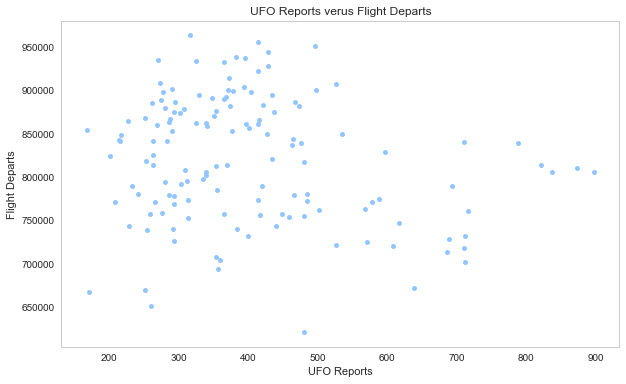

In [98]:
plt.figure(figsize=(10, 6))
plt.plot(mthUFOFlights.UFOs, mthUFOFlights.Flights, "o", markersize=5)
plt.xlabel("UFO Reports")
plt.ylabel("Flight Departs")
plt.title("UFO Reports verus Flight Departs")
plt.grid()

Optimal slope: -89.30643139209772
Optimal intercept: 855986.2640846046


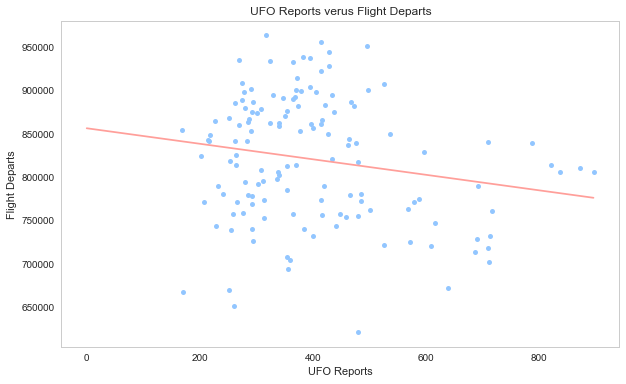

In [99]:
slope_opt = mthUFOFlights.UFOs.cov(mthUFOFlights.Flights) / mthUFOFlights.UFOs.var()
intercept_opt = mthUFOFlights.Flights.mean() - slope_opt * mthUFOFlights.UFOs.mean()

print("Optimal slope: {}".format(slope_opt))
print("Optimal intercept: {}".format(intercept_opt))

fig = plt.figure(figsize=(10, 6))
plt.plot(mthUFOFlights.UFOs, mthUFOFlights.Flights, "o", markersize=5)
plt.xlabel("UFO Reports")
plt.ylabel("Flight Departs")
plt.title("UFO Reports verus Flight Departs")
plt.grid()

xvals = np.arange(mthUFOFlights.UFOs.max())
yvals = slope_opt * xvals + intercept_opt
plt.plot(xvals, yvals, color="r")
fig.canvas.draw()

In [100]:
import statsmodels.api as sm
mthUFOFlights["Constant"] = 1
m = sm.OLS(mthUFOFlights.Flights, mthUFOFlights[["UFOs", "Constant"]]).fit()
m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Flights   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     5.016
Date:                Wed, 20 Dec 2017   Prob (F-statistic):             0.0267
Time:                        00:18:31   Log-Likelihood:                -1749.8
No. Observations:                 139   AIC:                             3504.
Df Residuals:                     137   BIC:                             3510.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
UFOs         -89.3064     39.875     -2.240      0.027    -168.156     -10.457
Constant     8.56e+05   1.72e+04     49.906      0.000    8.22e+05     8.9e+05
==============================================================================
Omnibus:                        3.024   Durbin-Watson:                   0.537
Prob(Omnibus):                  0.220   Jarque-Bera (JB):                2.895
Skew:                          -0.290   Prob(JB):                        0.235
Kurtosis:                       2.597   Cond. No.                     1.22e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.22e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

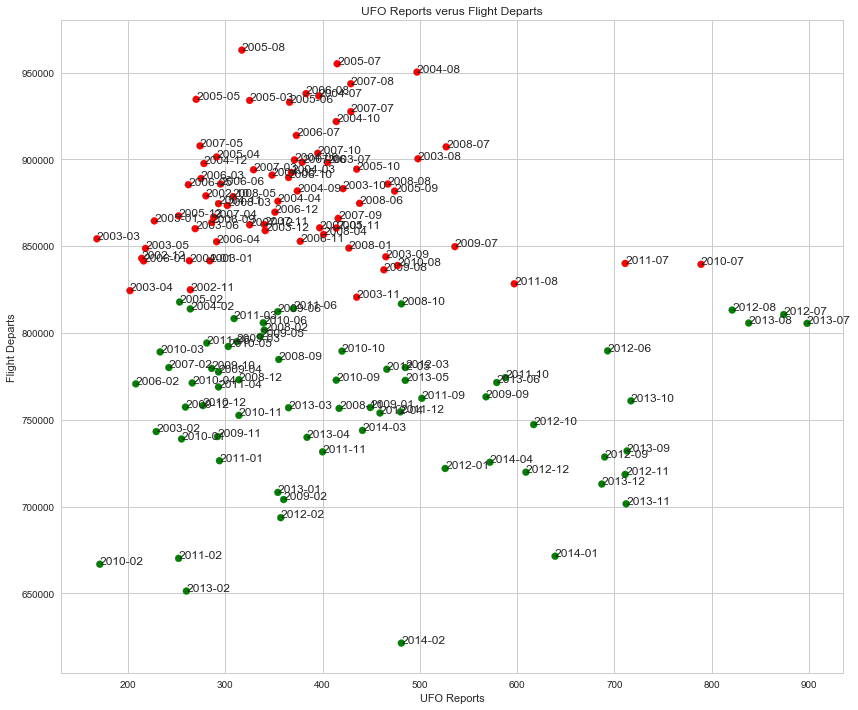

In [166]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(mthUFOFlights[['UFOs', 'Flights']].values)
mthUFOFlights['Label'] = kmeans.labels_
mthUFOFlights.head()

labels = kmeans.labels_
colors = ['red','green']
mthLabels = mthUFOFlights.Month.apply(lambda x: x.strftime('%Y-%m'))
fig, ax = plt.subplots()
fig.set_size_inches(14, 12)
ax.scatter(clusterDF.UFOs, clusterDF.Flights, marker="o", c=labels, cmap=matplotlib.colors.ListedColormap(colors))
for i, txt in enumerate(mthLabels):
    ax.annotate(txt, (clusterDF.UFOs[i],clusterDF.Flights[i]))
plt.xlabel("UFO Reports")
plt.ylabel("Flight Departs")
plt.title("UFO Reports verus Flight Departs")

<h1><u>Conclusions:</u></h1>

<h1><u>Further analysis/work:</u></h1>

<h3>UFO Reports By Month of Year</h3>

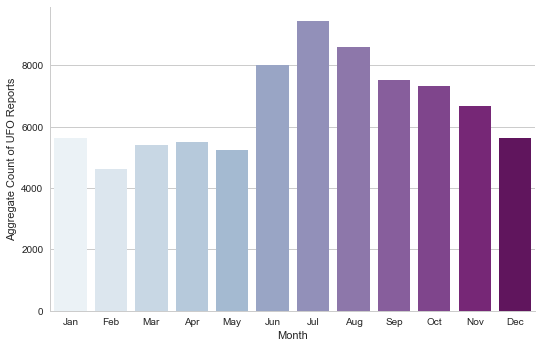

In [103]:
ufos_by_month_df = pd.DataFrame(data=ufos['datetime'].dt.month)
ufos_by_month_df.rename(columns={'datetime': 'Month'}, inplace=True)
g = sns.factorplot(x="Month", data=ufos_by_month_df, kind="count",
                   palette="BuPu", size=5, aspect=1.5, order=months)
labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
g.set_xticklabels(labels);
g.set(xlabel='Month', ylabel='Aggregate Count of UFO Reports')

<h3 style="background-color:#82CAFF; padding: 5px;">Analysis of Reports by Month</h3>

More sightings were reported in the summer months than at any other time of the year. This could be because UFO sightings usually take place outside, thus people have to *be outside* to see them. Since this data comes mostly from the US, we can assume that more people went outside during the summer months. Thus, it makes sense that more sightings were reported at those times; there were more people outside to observe the night sky.

## Updating Map

In [104]:
years_from_col = np.array(ufos['datetime'].dt.year)
years_from_col[np.isnan(years_from_col)] = 0
years_from_col = np.array(sorted(np.unique(years_from_col)))
years_from_col = years_from_col[np.where( (years_from_col > 1940) & (years_from_col < 2014) )]
years_from_col = [int(year) for year in years_from_col]
years = [str(year) for year in years_from_col]

figure = {
    'data': [],
    'layout': {},
    'frames': []
}
figure['layout']['title'] = 'UFO Sightings Throughout the US'
figure['layout']['geo'] = dict(
        scope='usa',
        projection=dict( type='albers usa' ),
        showland = True,
        landcolor = "rgb(250, 250, 250)",
        subunitcolor = "rgb(217, 217, 217)",
        countrycolor = "rgb(217, 217, 217)",
        countrywidth = 0.5,
        subunitwidth = 0.5
)
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1941',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 14},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

year = 1941
year_ufos = ufos[(ufos.datetime.dt.year == year) & (ufos.country == 'us')]
year_ufos.loc[(year_ufos.dur_secs > 9600.0), ('dur_secs')] = 9600.0
frame = {'data': [], 'name': str(year)}
data_dict = dict(
    type = 'scattergeo',
    locationmode = 'USA-states',
    lat = year_ufos['latitude'],
    lon = year_ufos['longitude'],
    mode = 'markers',
    marker = dict( 
        size = .5*np.power(year_ufos['dur_secs'],.4), 
        opacity = 0.7,
        reversescale = True,
        autocolorscale = False,
        symbol = 'dot',
        line = dict(
            width=1,
            color='rgba(102, 102, 102)'
        ),
    )
)
figure['data'].append(data_dict)

for year in years_from_col:
    year_ufos = ufos[(ufos.datetime.dt.year == year) & (ufos.country == 'us')]
    year_ufos.loc[(year_ufos.dur_secs > 9600.0), ('dur_secs')] = 9600.0
    frame = {'data': [], 'name': str(year)}
    data_dict = dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lat = year_ufos['latitude'],
        lon = year_ufos['longitude'],
        mode = 'markers',
        marker = dict( 
            size = .5*np.power(year_ufos['dur_secs'],.4), 
            opacity = 0.7,
            reversescale = True,
            autocolorscale = False,
            symbol = 'dot',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
        ),
    )
    frame['data'].append(data_dict)
    figure['frames'].append(frame)
    slider_step = {'args': [
            [str(year)],
            {'frame': {'duration': 300, 'redraw': False},
             'mode': 'immediate',
           'transition': {'duration': 300}}
         ],
         'label': str(year),
         'method': 'animate'
    }
    sliders_dict['steps'].append(slider_step)
        
figure['layout']['sliders'] = [sliders_dict]

c:\python35\lib\site-packages\pandas\core\indexing.py:477: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [105]:
pyoff.iplot(figure)